### После классификации

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text # Not used directly but needed to import TF ops.
from modules.evaluation import calculate_embeddings, mapk, apk, Index
from tqdm import tqdm

import pickle
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
from tensorflow.python.distribute import distribution_strategy_context as distribute_ctx
from tensorflow.python.eager import context, def_function
from tensorflow.python.framework import constant_op, tensor_spec, tensor_shape, ops, dtypes
from tensorflow.python.keras import backend as K
from tensorflow.python.keras.engine import base_layer
from tensorflow.python.keras.engine import base_layer_utils
from tensorflow.python.keras.losses import categorical_crossentropy
from tensorflow.python.keras.utils import metrics_utils
from tensorflow.python.keras.utils.generic_utils import deserialize_keras_object
from tensorflow.python.keras.utils.generic_utils import serialize_keras_object
from tensorflow.python.keras.utils.generic_utils import to_list
from tensorflow.python.keras.utils.tf_utils import is_tensor_or_variable
from tensorflow.python.ops import array_ops, weights_broadcast_ops, confusion_matrix, check_ops, control_flow_ops, math_ops, init_ops, nn
from tensorflow.python.ops import variables as tf_variables
from tensorflow.python.ops.losses import util as tf_losses_utils
from tensorflow.python.training.tracking import base as trackable
from tensorflow.python.util import nest, tf_inspect
from tensorflow.python.util.tf_export import keras_export
from tensorflow.tools.docs import doc_controls

class AUC(tf.keras.metrics.Metric):
  """Computes the approximate AUC (Area under the curve) via a Riemann sum.
  This metric creates four local variables, `true_positives`, `true_negatives`,
  `false_positives` and `false_negatives` that are used to compute the AUC.
  To discretize the AUC curve, a linearly spaced set of thresholds is used to
  compute pairs of recall and precision values. The area under the ROC-curve is
  therefore computed using the height of the recall values by the false positive
  rate, while the area under the PR-curve is the computed using the height of
  the precision values by the recall.
  This value is ultimately returned as `auc`, an idempotent operation that
  computes the area under a discretized curve of precision versus recall values
  (computed using the aforementioned variables). The `num_thresholds` variable
  controls the degree of discretization with larger numbers of thresholds more
  closely approximating the true AUC. The quality of the approximation may vary
  dramatically depending on `num_thresholds`. The `thresholds` parameter can be
  used to manually specify thresholds which split the predictions more evenly.
  For best results, `predictions` should be distributed approximately uniformly
  in the range [0, 1] and not peaked around 0 or 1. The quality of the AUC
  approximation may be poor if this is not the case. Setting `summation_method`
  to 'minoring' or 'majoring' can help quantify the error in the approximation
  by providing lower or upper bound estimate of the AUC.
  If `sample_weight` is `None`, weights default to 1.
  Use `sample_weight` of 0 to mask values.
  Usage:
  >>> m = tf.keras.metrics.AUC(num_thresholds=3)
  >>> _ = m.update_state([0, 0, 1, 1], [0, 0.5, 0.3, 0.9])
  >>> # threshold values are [0 - 1e-7, 0.5, 1 + 1e-7]
  >>> # tp = [2, 1, 0], fp = [2, 0, 0], fn = [0, 1, 2], tn = [0, 2, 2]
  >>> # recall = [1, 0.5, 0], fp_rate = [1, 0, 0]
  >>> # auc = ((((1+0.5)/2)*(1-0))+ (((0.5+0)/2)*(0-0))) = 0.75
  >>> m.result().numpy()
  0.75
  >>> m.reset_states()
  >>> _ = m.update_state([0, 0, 1, 1], [0, 0.5, 0.3, 0.9],
  ...                    sample_weight=[1, 0, 0, 1])
  >>> m.result().numpy()
  1.0
  Usage with tf.keras API:
  ```python
  model = tf.keras.Model(inputs, outputs)
  model.compile('sgd', loss='mse', metrics=[tf.keras.metrics.AUC()])
  ```
  """

  def __init__(self,
               num_thresholds=200,
               curve='ROC',
               summation_method='interpolation',
               name=None,
               dtype=None,
               thresholds=None,
               multi_label=False,
               label_weights=None):
    """Creates an `AUC` instance.
    Args:
      num_thresholds: (Optional) Defaults to 200. The number of thresholds to
        use when discretizing the roc curve. Values must be > 1.
      curve: (Optional) Specifies the name of the curve to be computed, 'ROC'
        [default] or 'PR' for the Precision-Recall-curve.
      summation_method: (Optional) Specifies the Riemann summation method used
        (https://en.wikipedia.org/wiki/Riemann_sum): 'interpolation' [default],
          applies mid-point summation scheme for `ROC`. For PR-AUC, interpolates
          (true/false) positives but not the ratio that is precision (see Davis
          & Goadrich 2006 for details); 'minoring' that applies left summation
          for increasing intervals and right summation for decreasing intervals;
          'majoring' that does the opposite.
      name: (Optional) string name of the metric instance.
      dtype: (Optional) data type of the metric result.
      thresholds: (Optional) A list of floating point values to use as the
        thresholds for discretizing the curve. If set, the `num_thresholds`
        parameter is ignored. Values should be in [0, 1]. Endpoint thresholds
        equal to {-epsilon, 1+epsilon} for a small positive epsilon value will
        be automatically included with these to correctly handle predictions
        equal to exactly 0 or 1.
      multi_label: boolean indicating whether multilabel data should be
        treated as such, wherein AUC is computed separately for each label and
        then averaged across labels, or (when False) if the data should be
        flattened into a single label before AUC computation. In the latter
        case, when multilabel data is passed to AUC, each label-prediction pair
        is treated as an individual data point. Should be set to False for
        multi-class data.
      label_weights: (optional) list, array, or tensor of non-negative weights
        used to compute AUCs for multilabel data. When `multi_label` is True,
        the weights are applied to the individual label AUCs when they are
        averaged to produce the multi-label AUC. When it's False, they are used
        to weight the individual label predictions in computing the confusion
        matrix on the flattened data. Note that this is unlike class_weights in
        that class_weights weights the example depending on the value of its
        label, whereas label_weights depends only on the index of that label
        before flattening; therefore `label_weights` should not be used for
        multi-class data.
    """
    # Validate configurations.
    if isinstance(curve, metrics_utils.AUCCurve) and curve not in list(
        metrics_utils.AUCCurve):
      raise ValueError('Invalid curve: "{}". Valid options are: "{}"'.format(
          curve, list(metrics_utils.AUCCurve)))
    if isinstance(
        summation_method,
        metrics_utils.AUCSummationMethod) and summation_method not in list(
            metrics_utils.AUCSummationMethod):
      raise ValueError(
          'Invalid summation method: "{}". Valid options are: "{}"'.format(
              summation_method, list(metrics_utils.AUCSummationMethod)))

    # Update properties.
    if thresholds is not None:
      # If specified, use the supplied thresholds.
      self.num_thresholds = len(thresholds) + 2
      thresholds = sorted(thresholds)
    else:
      if num_thresholds <= 1:
        raise ValueError('`num_thresholds` must be > 1.')

      # Otherwise, linearly interpolate (num_thresholds - 2) thresholds in
      # (0, 1).
      self.num_thresholds = num_thresholds
      thresholds = [(i + 1) * 1.0 / (num_thresholds - 1)
                    for i in range(num_thresholds - 2)]

    # Add an endpoint "threshold" below zero and above one for either
    # threshold method to account for floating point imprecisions.
    self.thresholds = [0.0 - K.epsilon()] + thresholds + [1.0 + K.epsilon()]

    if isinstance(curve, metrics_utils.AUCCurve):
      self.curve = curve
    else:
      self.curve = metrics_utils.AUCCurve.from_str(curve)
    if isinstance(summation_method, metrics_utils.AUCSummationMethod):
      self.summation_method = summation_method
    else:
      self.summation_method = metrics_utils.AUCSummationMethod.from_str(
          summation_method)
    super(AUC, self).__init__(name=name, dtype=dtype)

    # Handle multilabel arguments.
    self.multi_label = multi_label
    if label_weights is not None:
      label_weights = constant_op.constant(label_weights, dtype=self.dtype)
      checks = [
          check_ops.assert_non_negative(
              label_weights,
              message='All values of `label_weights` must be non-negative.')
      ]
      self.label_weights = control_flow_ops.with_dependencies(
          checks, label_weights)

    else:
      self.label_weights = None

    self._built = False
    if self.multi_label:
      self._num_labels = None
    else:
      self._build(None)

  def _build(self, shape):
    """Initialize TP, FP, TN, and FN tensors, given the shape of the data."""
    if self.multi_label:
      if shape.ndims != 2:
        raise ValueError('`y_true` must have rank=2 when `multi_label` is '
                         'True. Found rank %s.' % shape.ndims)
      self._num_labels = shape[1]
      variable_shape = tensor_shape.TensorShape(
          [tensor_shape.Dimension(self.num_thresholds), self._num_labels])

    else:
      variable_shape = tensor_shape.TensorShape(
          [tensor_shape.Dimension(self.num_thresholds)])
    self._build_input_shape = shape
    # Create metric variables
    self.true_positives = self.add_weight(
        'true_positives',
        shape=variable_shape,
        initializer=init_ops.zeros_initializer)
    self.true_negatives = self.add_weight(
        'true_negatives',
        shape=variable_shape,
        initializer=init_ops.zeros_initializer)
    self.false_positives = self.add_weight(
        'false_positives',
        shape=variable_shape,
        initializer=init_ops.zeros_initializer)
    self.false_negatives = self.add_weight(
        'false_negatives',
        shape=variable_shape,
        initializer=init_ops.zeros_initializer)

    if self.multi_label:
      with ops.init_scope():
        # This should only be necessary for handling v1 behavior. In v2, AUC
        # should be initialized outside of any tf.functions, and therefore in
        # eager mode.
        if not context.executing_eagerly():
          K._initialize_variables(K._get_session())  # pylint: disable=protected-access

    self._built = True

  def update_state(self, y_true, y_pred, sample_weight=None):
    """Accumulates confusion matrix statistics.
    Args:
      y_true: The ground truth values.
      y_pred: The predicted values.
      sample_weight: Optional weighting of each example. Defaults to 1. Can be a
        `Tensor` whose rank is either 0, or the same rank as `y_true`, and must
        be broadcastable to `y_true`.
    Returns:
      Update op.
    """
    deps = []
    if not self._built:
      self._build(tensor_shape.TensorShape(y_pred.shape))

    if self.multi_label or (self.label_weights is not None):
      # y_true should have shape (number of examples, number of labels).
      shapes = [
          (y_true, ('N', 'L'))
      ]
      if self.multi_label:
        # TP, TN, FP, and FN should all have shape
        # (number of thresholds, number of labels).
        shapes.extend([(self.true_positives, ('T', 'L')),
                       (self.true_negatives, ('T', 'L')),
                       (self.false_positives, ('T', 'L')),
                       (self.false_negatives, ('T', 'L'))])
      if self.label_weights is not None:
        # label_weights should be of length equal to the number of labels.
        shapes.append((self.label_weights, ('L',)))
      deps = [
          check_ops.assert_shapes(
              shapes, message='Number of labels is not consistent.')
      ]

    # Only forward label_weights to update_confusion_matrix_variables when
    # multi_label is False. Otherwise the averaging of individual label AUCs is
    # handled in AUC.result
    label_weights = None if self.multi_label else self.label_weights
    metrics_utils.update_confusion_matrix_variables(
          {
              metrics_utils.ConfusionMatrix.TRUE_POSITIVES:
                  self.true_positives,
              metrics_utils.ConfusionMatrix.TRUE_NEGATIVES:
                  self.true_negatives,
              metrics_utils.ConfusionMatrix.FALSE_POSITIVES:
                  self.false_positives,
              metrics_utils.ConfusionMatrix.FALSE_NEGATIVES:
                  self.false_negatives,
          },
          y_true,
          y_pred,
          self.thresholds,
          sample_weight=sample_weight,
          multi_label=self.multi_label,
          label_weights=label_weights)

  def interpolate_pr_auc(self):
    """Interpolation formula inspired by section 4 of Davis & Goadrich 2006.
    https://www.biostat.wisc.edu/~page/rocpr.pdf
    Note here we derive & use a closed formula not present in the paper
    as follows:
      Precision = TP / (TP + FP) = TP / P
    Modeling all of TP (true positive), FP (false positive) and their sum
    P = TP + FP (predicted positive) as varying linearly within each interval
    [A, B] between successive thresholds, we get
      Precision slope = dTP / dP
                      = (TP_B - TP_A) / (P_B - P_A)
                      = (TP - TP_A) / (P - P_A)
      Precision = (TP_A + slope * (P - P_A)) / P
    The area within the interval is (slope / total_pos_weight) times
      int_A^B{Precision.dP} = int_A^B{(TP_A + slope * (P - P_A)) * dP / P}
      int_A^B{Precision.dP} = int_A^B{slope * dP + intercept * dP / P}
    where intercept = TP_A - slope * P_A = TP_B - slope * P_B, resulting in
      int_A^B{Precision.dP} = TP_B - TP_A + intercept * log(P_B / P_A)
    Bringing back the factor (slope / total_pos_weight) we'd put aside, we get
      slope * [dTP + intercept *  log(P_B / P_A)] / total_pos_weight
    where dTP == TP_B - TP_A.
    Note that when P_A == 0 the above calculation simplifies into
      int_A^B{Precision.dTP} = int_A^B{slope * dTP} = slope * (TP_B - TP_A)
    which is really equivalent to imputing constant precision throughout the
    first bucket having >0 true positives.
    Returns:
      pr_auc: an approximation of the area under the P-R curve.
    """
    dtp = self.true_positives[:self.num_thresholds -
                              1] - self.true_positives[1:]
    p = self.true_positives + self.false_positives
    dp = p[:self.num_thresholds - 1] - p[1:]
    prec_slope = math_ops.div_no_nan(
        dtp, math_ops.maximum(dp, 0), name='prec_slope')
    intercept = self.true_positives[1:] - math_ops.multiply(prec_slope, p[1:])

    safe_p_ratio = array_ops.where(
        math_ops.logical_and(p[:self.num_thresholds - 1] > 0, p[1:] > 0),
        math_ops.div_no_nan(
            p[:self.num_thresholds - 1],
            math_ops.maximum(p[1:], 0),
            name='recall_relative_ratio'),
        array_ops.ones_like(p[1:]))

    pr_auc_increment = math_ops.div_no_nan(
        prec_slope * (dtp + intercept * math_ops.log(safe_p_ratio)),
        math_ops.maximum(self.true_positives[1:] + self.false_negatives[1:], 0),
        name='pr_auc_increment')

    if self.multi_label:
      by_label_auc = math_ops.reduce_sum(
          pr_auc_increment, name=self.name + '_by_label', axis=0)
      if self.label_weights is None:
        # Evenly weighted average of the label AUCs.
        return math_ops.reduce_mean(by_label_auc, name=self.name)
      else:
        # Weighted average of the label AUCs.
        return math_ops.div_no_nan(
            math_ops.reduce_sum(
                math_ops.multiply(by_label_auc, self.label_weights)),
            math_ops.reduce_sum(self.label_weights),
            name=self.name)
    else:
      return math_ops.reduce_sum(pr_auc_increment, name='interpolate_pr_auc')

  def result(self):
    if (self.curve == metrics_utils.AUCCurve.PR and
        self.summation_method == metrics_utils.AUCSummationMethod.INTERPOLATION
       ):
      # This use case is different and is handled separately.
      return self.interpolate_pr_auc()

    # Set `x` and `y` values for the curves based on `curve` config.
    recall = math_ops.div_no_nan(self.true_positives,
                                 self.true_positives + self.false_negatives)
    if self.curve == metrics_utils.AUCCurve.ROC:
      fp_rate = math_ops.div_no_nan(self.false_positives,
                                    self.false_positives + self.true_negatives)
      x = fp_rate
      y = recall
    else:  # curve == 'PR'.
      precision = math_ops.div_no_nan(
          self.true_positives, self.true_positives + self.false_positives)
      x = recall
      y = precision

    # Find the rectangle heights based on `summation_method`.
    if self.summation_method == metrics_utils.AUCSummationMethod.INTERPOLATION:
      # Note: the case ('PR', 'interpolation') has been handled above.
      heights = (y[:self.num_thresholds - 1] + y[1:]) / 2.
    elif self.summation_method == metrics_utils.AUCSummationMethod.MINORING:
      heights = math_ops.minimum(y[:self.num_thresholds - 1], y[1:])
    else:  # self.summation_method = metrics_utils.AUCSummationMethod.MAJORING:
      heights = math_ops.maximum(y[:self.num_thresholds - 1], y[1:])

    # Sum up the areas of all the rectangles.
    if self.multi_label:
      riemann_terms = math_ops.multiply(x[:self.num_thresholds - 1] - x[1:],
                                        heights)
      by_label_auc = math_ops.reduce_sum(
          riemann_terms, name=self.name + '_by_label', axis=0)

      if self.label_weights is None:
        # Unweighted average of the label AUCs.
        return math_ops.reduce_mean(by_label_auc, name=self.name)
      else:
        # Weighted average of the label AUCs.
        return math_ops.div_no_nan(
            math_ops.reduce_sum(
                math_ops.multiply(by_label_auc, self.label_weights)),
            math_ops.reduce_sum(self.label_weights),
            name=self.name)
    else:
      return math_ops.reduce_sum(
          math_ops.multiply(x[:self.num_thresholds - 1] - x[1:], heights),
          name=self.name)

  def reset_states(self):
    if self.multi_label:
      K.batch_set_value([(v, np.zeros((self.num_thresholds, self._num_labels)))
                         for v in self.variables])
    else:
      K.batch_set_value([
          (v, np.zeros((self.num_thresholds,))) for v in self.variables
      ])

  def get_config(self):
    if is_tensor_or_variable(self.label_weights):
      label_weights = K.eval(self.label_weights)
    else:
      label_weights = self.label_weights
    config = {
        'num_thresholds': self.num_thresholds,
        'curve': self.curve.value,
        'summation_method': self.summation_method.value,
        # We remove the endpoint thresholds as an inverse of how the thresholds
        # were initialized. This ensures that a metric initialized from this
        # config has the same thresholds.
        'thresholds': self.thresholds[1:-1],
        'multi_label': self.multi_label,
        'label_weights': label_weights
    }
    base_config = super(AUC, self).get_config()
    return dict(list(base_config.items()) + list(config.items()))

In [3]:
model = tf.keras.models.load_model('models/USE_classif.h5', custom_objects={'KerasLayer':hub.KerasLayer, 'auc': AUC}, compile=False)
df = pd.read_parquet('data/test.parquet'); df.head()

,question,_call_4_collaboration,_general_en,_jobs,_jobs_academy_phd,_jobs_hr,_meetings,_meetings_boardgames,_meetings_ca,_meetings_chel,...,tool_dvc,tool_kaos,tool_kekas,tool_segmentation,trading,true_story,visualization,welcome,whateverhack,writing_n_presenting
0,"Хочу предсказывать сессии, наткнулся на статью...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,#project_alice\nРешил проверить даст ли прирос...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"Я к вам с PR'ом, какашками можно кидать тут.\n...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Написал мне один парень c Brown - порекомендуй...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Hello does dataset with faces fetch_lfw_people...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
with open('data/label_weights.pkl', 'rb') as f:
    class_weights = pickle.load(f)

In [5]:
METRICS = [tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
           AUC(name='auc', multi_label=True, label_weights=list(class_weights.values()))]

In [6]:
opt = tf.keras.optimizers.Adam(learning_rate=1e-5, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False, name='Adam')
loss_fn = tf.keras.losses.CategoricalCrossentropy(from_logits=False, label_smoothing=0,  
                                                  name='categorical_crossentropy')

model.compile(loss=loss_fn, optimizer=opt, run_eagerly=True, metrics=METRICS)

In [7]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Question (InputLayer)        [(None, 1)]               0         
_________________________________________________________________
tf_op_layer_Squeeze (TensorF None                      0         
_________________________________________________________________
USE (KerasLayer)             (None, 512)               68927232  
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
Dense (Dense)                (None, 249)               127737    
Total params: 69,054,969
Trainable params: 69,054,969
Non-trainable params: 0
_________________________________________________________________


In [8]:
preds = model.predict(df['question'], batch_size=32)

In [9]:
labels = df.drop('question', axis=1).to_numpy()
labels.shape

(79658, 249)

In [10]:
labels = tf.math.argmax(labels, axis=1, output_type=tf.dtypes.int32)
preds = tf.math.argmax(preds, axis=1, output_type=tf.dtypes.int32)

In [22]:
weights = []
for pred in preds:
    weights.append(class_weights[pred.numpy()])

In [25]:
tf.math.confusion_matrix(labels, preds)

<tf.Tensor: shape=(249, 249), dtype=int32, numpy=
array([[ 24,   0,  77, ...,   5,   0,   0],
       [  0,   8,   0, ...,   0,   0,   0],
       [  0,   0, 290, ...,   0,   0,   0],
       ...,
       [  0,   2,  13, ..., 139,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,  17]], dtype=int32)>

In [27]:
cm = tf.math.confusion_matrix(labels, preds, num_classes=None, weights=None, dtype=tf.dtypes.int32, name=None)
cm

<tf.Tensor: shape=(249, 249), dtype=int32, numpy=
array([[ 24,   0,  77, ...,   5,   0,   0],
       [  0,   8,   0, ...,   0,   0,   0],
       [  0,   0, 290, ...,   0,   0,   0],
       ...,
       [  0,   2,  13, ..., 139,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,  17]], dtype=int32)>

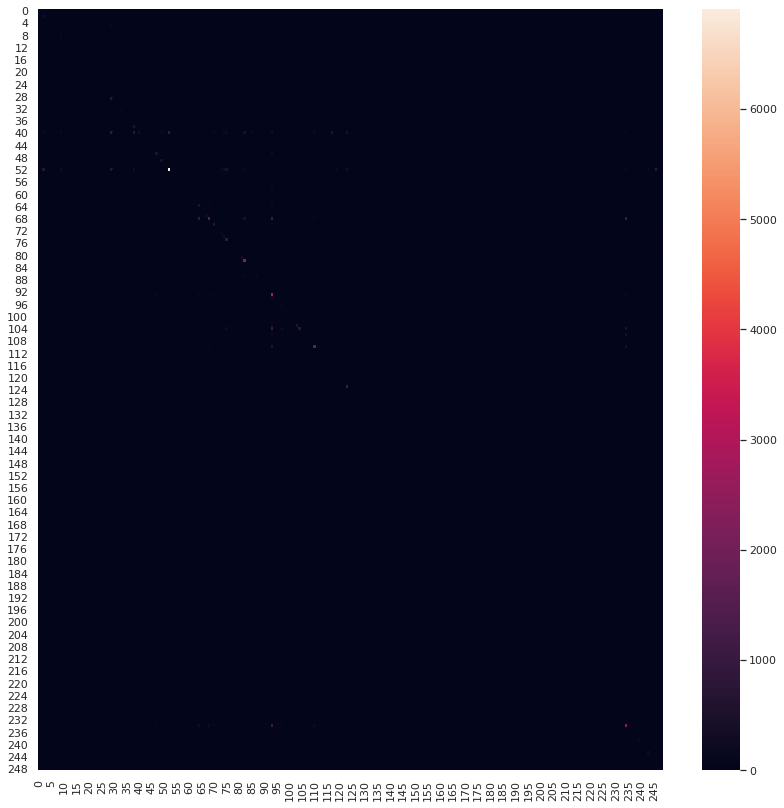

In [28]:
sns.set(rc={'figure.figsize':(14,14)})
sns.heatmap(cm)